# Introduction
The objective of this project was to process an image of a sheet that contained various forms of noise such as shadows, lighting inconsistencies, unwanted background, and orientation distortions. The goal was to augment the image by isolating the sheet, effectively mimicking the quality of a scanned document.

This notebook specifically focuses on solving two of the key challenges: removing the unwanted background and correcting the sheet’s orientation (i.e., adjusting for the angle at which the photo was taken). To achieve this, I utilized computer vision techniques with OpenCV, implementing edge detection and contour analysis to identify the sheet within the image. Once the contour was extracted, I applied a perspective transformation to crop and rectify the image, producing a properly aligned output.

While this approach attempts to isolate the sheet and correct its perspective, it does not yet address shadows and lighting variations that the image may have. At the end I discuss further improvements and propose an alternative method that could potentially eliminate all forms of noise.

Note: This notebook uses python and would have to be converted to javascript (OpenCV.js) if implemented into the webpage.

# Installation
Install the necessary packages

In [ ]:
!pip install opencv-python opencv-python-headless matplotlib numpy

# Importing and Mounting

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from google.colab import drive
from google.colab import files

drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


# Load Original Image
Make sure to adjust the path to where your image is stored locally. Note: `cv2.imread` does not support .svg, .heic, .gif by default (.png, .jpeg, etc. are acceptable)

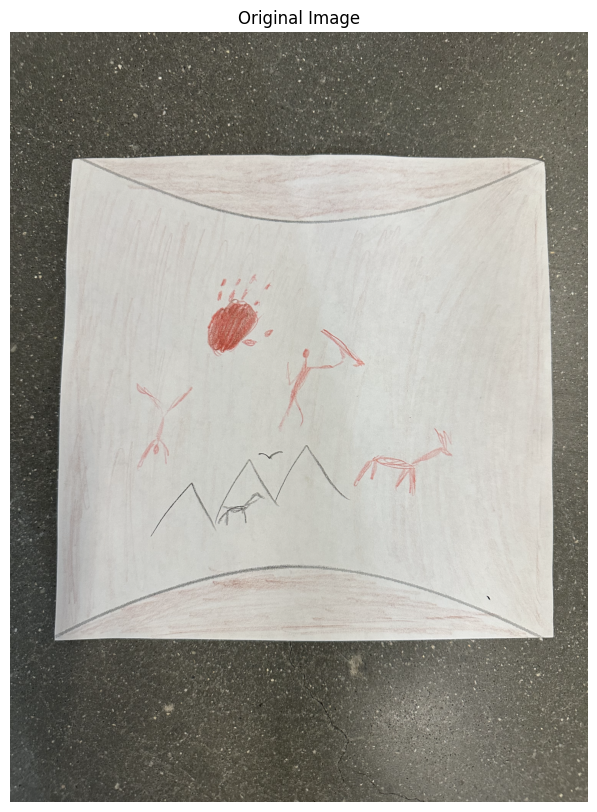

In [ ]:
def show_image(img, title="Image", resize=None, cmap_type='gray'):
    """Display an image with optional resizing."""
    if resize:
        img = cv2.resize(img, resize)

    plt.figure(figsize=(10, 10))
    if len(img.shape) == 2:
        plt.imshow(img, cmap=cmap_type)
    else:
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title(title)
    plt.axis('off')
    plt.show()

# adjust path as needed
input_image_path = '/content/drive/My Drive/CubeDraw/images/Right.png'

image = cv2.imread(input_image_path)

if image is not None:
    show_image(image, title="Original Image")
else:
    print("Image not found. Please check the path.")

# Preprocessing

First the image is converted to grayscale to enhance contrast, followed by Gaussian blur to reduce noise and Canny edge detection to extract edges. To ensure the entire sheet is detected as a single, continuous contour, I utilized morphological operations to close small gaps and improve contour connectivity.

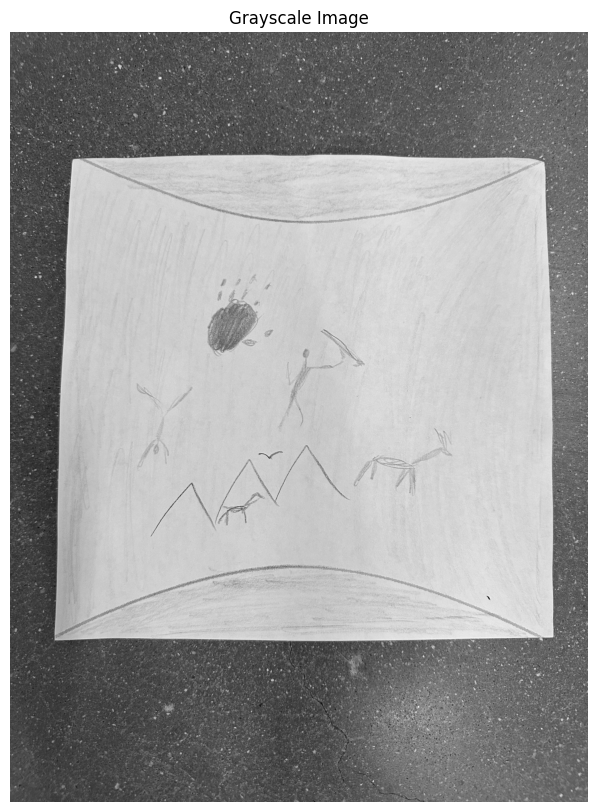

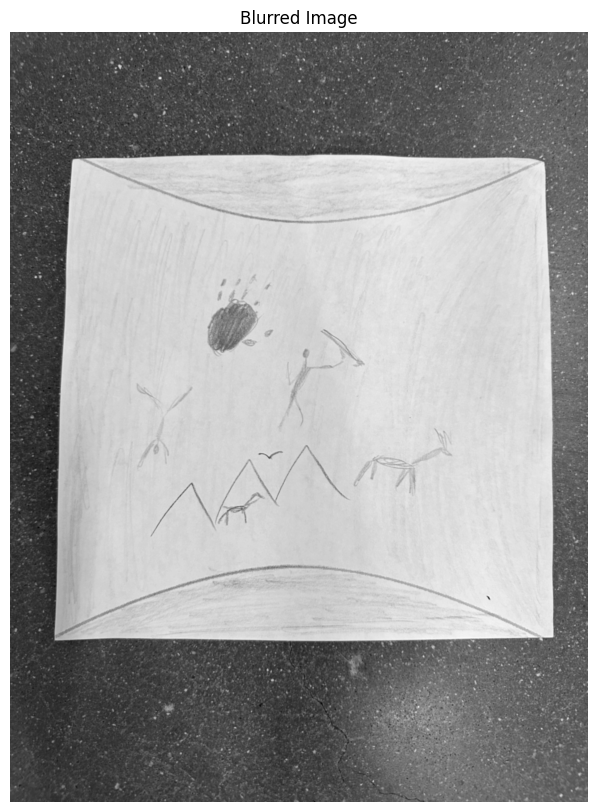

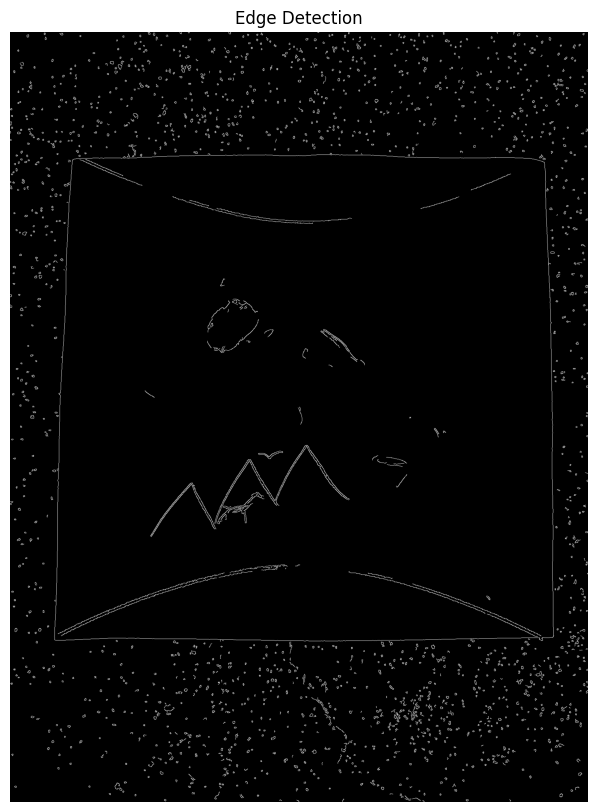

In [ ]:
def close_gaps_in_contours(edges):
    kernel = np.ones((5, 5), np.uint8)
    dilated = cv2.dilate(edges, kernel, iterations=1)
    eroded = cv2.erode(dilated, kernel, iterations=1)
    return eroded

def preprocess_image(img):
    """Convert image to grayscale, blur it, and detect edges."""
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    show_image(gray, "Grayscale Image")

    blurred = cv2.GaussianBlur(gray, (5, 5), 0)
    show_image(blurred, "Blurred Image")

    edges = cv2.Canny(blurred, 100, 200)
    edges_closed = close_gaps_in_contours(edges)
    show_image(edges, "Edge Detection")

    return edges_closed

edges = preprocess_image(image)

# Find Contour of Sheet

To identify the sheet's contour I first sorted all detected contours by their perimeter using `cv2.arcLength` and selected the top five. From these, I approximated each contour using `cv2.approxPolyDP` and chose the one with the largest area as it was most likely to represent the sheet.

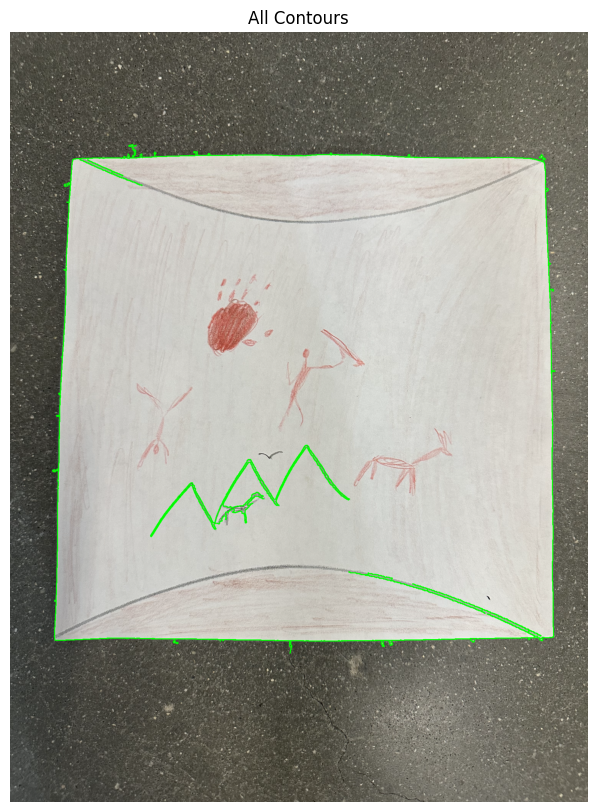

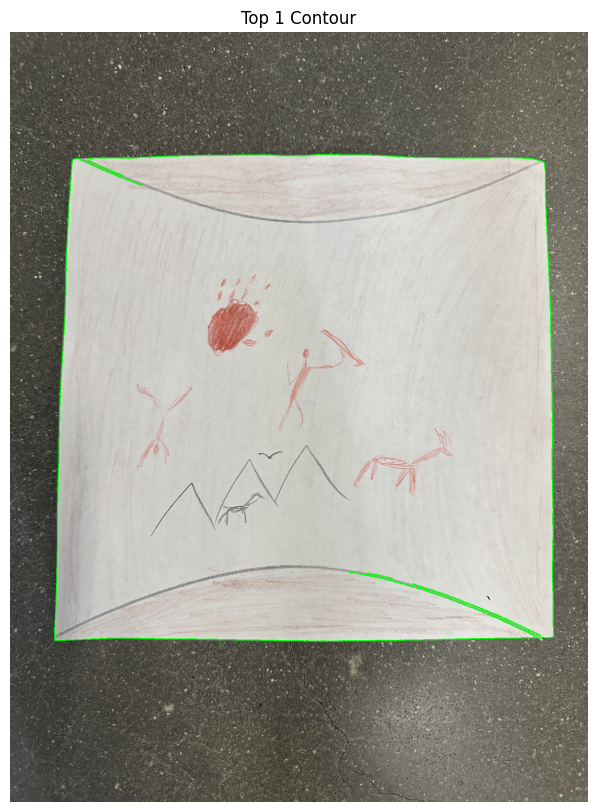

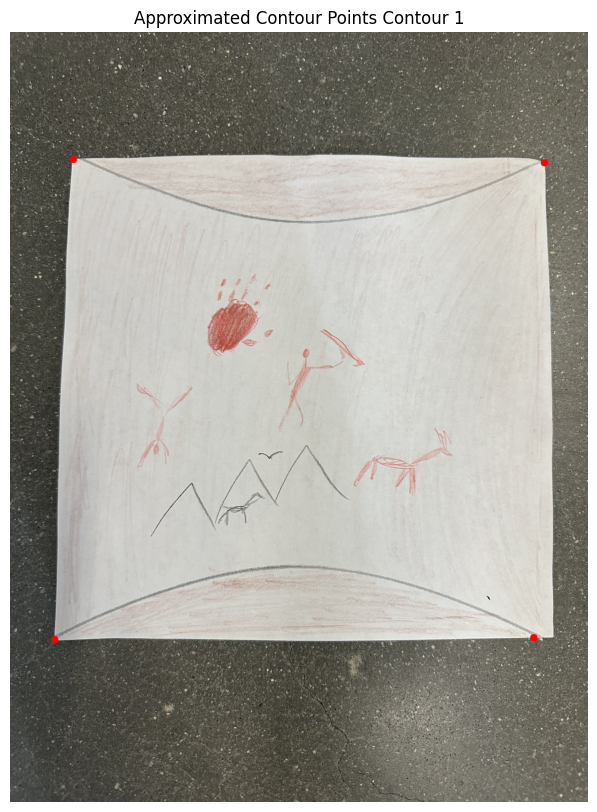

Area 1: 1705700.0


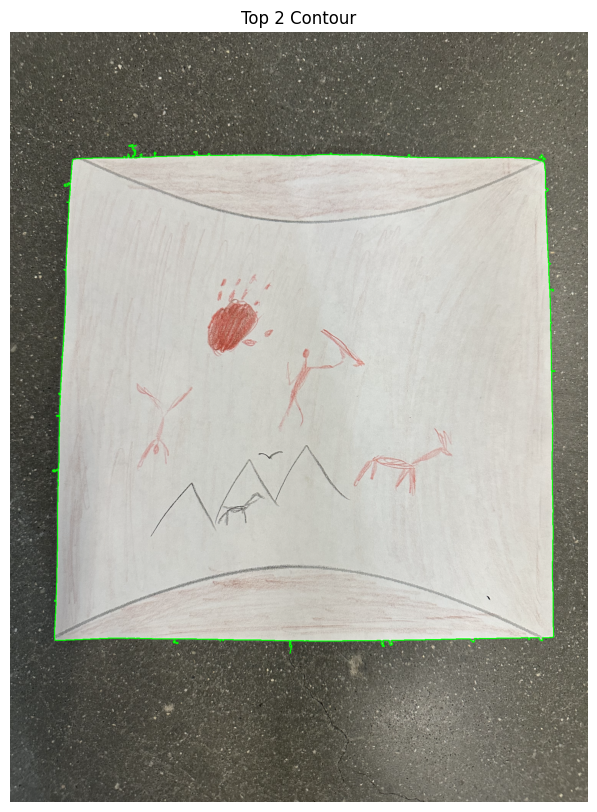

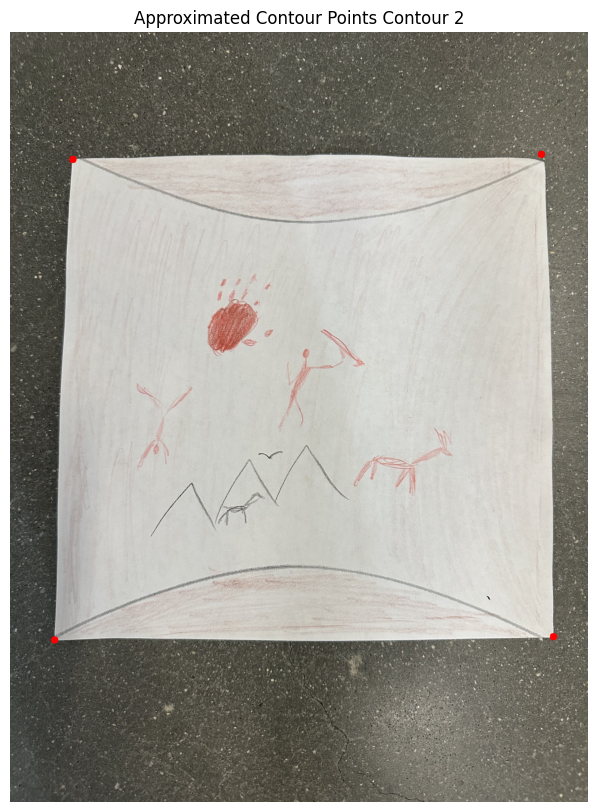

Area 2: 1750225.0


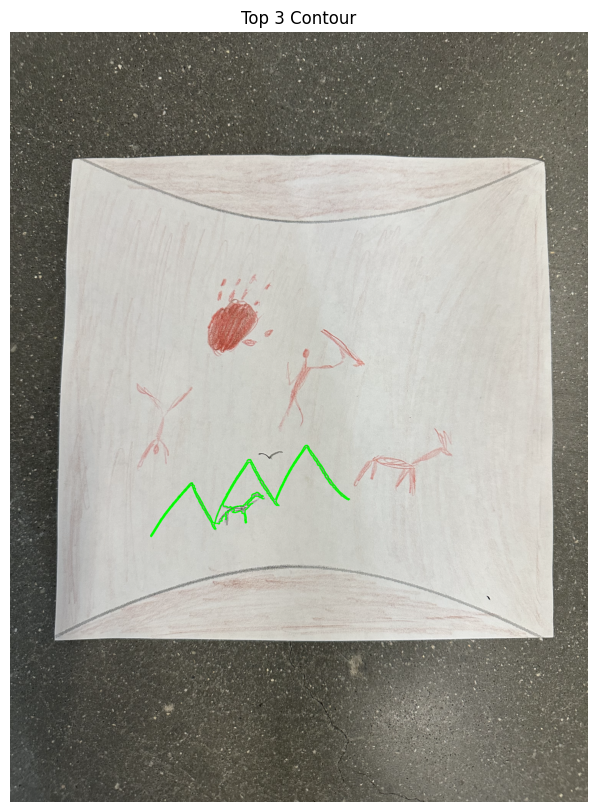

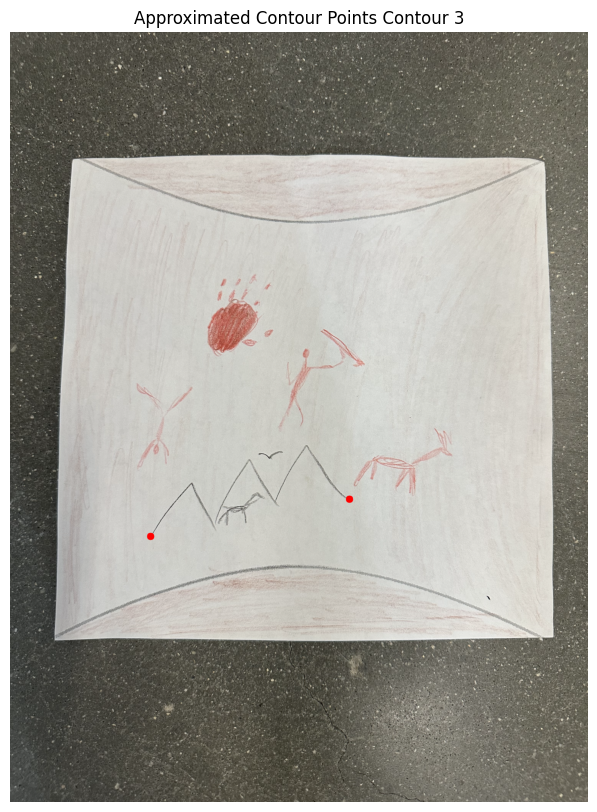

Area 3: 0.0


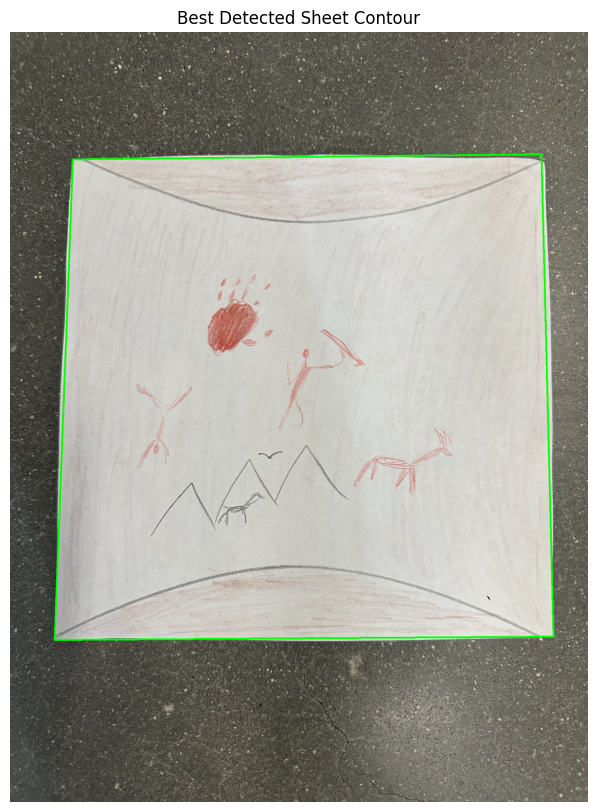

In [ ]:
def order_points(points):
    # Orders 4 points into (top-left, top-right, bottom-right, bottom-left)
    if len(points) != 4:
        print("Error: order_points received an invalid number of points:", points)
        return None

    points = np.array(points, dtype="int32")

    s = points.sum(axis=1)  # x + y
    diff = np.diff(points, axis=1)  # x - y

    ordered = np.zeros((4, 2), dtype="int32")
    ordered[0] = points[np.argmin(s)]  # Top-left
    ordered[2] = points[np.argmax(s)]  # Bottom-right
    ordered[1] = points[np.argmax(diff)]  # Top-right
    ordered[3] = points[np.argmin(diff)]  # Bottom-left

    return ordered

def find_farthest_points(approx):
    approx = np.array(approx).reshape(-1, 2)
    if len(approx) < 4:
        print("Error: Not enough points", approx)
        return None

    selected_points = [approx[0]]
    remaining_points = approx[1:]

    for _ in range(3):
        max_dist = 0
        farthest_point = None
        for point in remaining_points:
            min_dist = np.min([np.linalg.norm(point - sp) for sp in selected_points])
            if min_dist > max_dist:
                max_dist = min_dist
                farthest_point = point

        selected_points.append(farthest_point)
        remaining_points = [point for point in remaining_points if not np.array_equal(point, farthest_point)]

    return order_points(selected_points)

def calculate_quadrilateral_area(points):
    # Calculate area of a quadrilateral given four corner points using the Shoelace theorem
    if points is None or len(points) != 4:
        print("Error: Invalid points for area calculation:", points)
        return 0

    points = np.array(points)
    x = points[:, 0]
    y = points[:, 1]
    area = 0.5 * abs(x[0]*y[1] + x[1]*y[2] + x[2]*y[3] + x[3]*y[0] - (y[0]*x[1] + y[1]*x[2] + y[2]*x[3] + y[3]*x[0]))
    return area

def find_contours(edges, img, min_contour_length=2000):
    # All contours
    contours, _ = cv2.findContours(edges, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
    filtered_contours = [contour for contour in contours if cv2.arcLength(contour, True) >= min_contour_length]
    img_top_contours = img.copy()
    cv2.drawContours(img_top_contours, filtered_contours, -1, (0, 255, 0), 2)
    show_image(img_top_contours, f"All Contours")

    contours = sorted(filtered_contours, key=lambda c: cv2.arcLength(c, True), reverse=True)[:5]
    largest_area = 0
    best_farthest_points = None

    # search for the contour that is most likely the paper sheet
    for i, contour in enumerate(contours):
        img_top_contours = img.copy()
        cv2.drawContours(img_top_contours, [contour], -1, (0, 255, 0), 2)
        show_image(img_top_contours, f"Top {i+1} Contour")

        # approximate contour
        perimeter = cv2.arcLength(contour, True)
        approx = cv2.approxPolyDP(contour, 0.01 * perimeter, True)
        farthest_points = find_farthest_points(approx)

        if farthest_points is None or len(farthest_points) != 4:
            print(f"Skipping contour {i+1}: Invalid farthest points")
            continue

        img_points = img.copy()
        for point in farthest_points:
            x, y = point
            cv2.circle(img_points, (x, y), 10, (0, 0, 255), -1)
        show_image(img_points, f"Approximated Contour Points Contour {i+1}")

        area = calculate_quadrilateral_area(farthest_points)
        print(f"Area {i+1}: {area}")
        #print(f"Farthest points {i+1}: {farthest_points}")

        # if area is larger than the previous largest, update the best contour
        if area > largest_area:
            largest_area = area
            best_farthest_points = farthest_points

    img_paper = img.copy()
    cv2.drawContours(img_paper, [best_farthest_points], -1, (0, 255, 0), 3)
    show_image(img_paper, "Best Detected Sheet Contour")
    return best_farthest_points

contour = find_contours(edges, image)

# Apply Perspective Transformation
Finally I used the approximated points from the sheet's contour to apply a perspective transformation and obtain a top-down view. A transformation matrix was then generated with `cv2.getPerspectiveTransform`, and `cv2.warpPerspective` corrected the perspective to get the final cropped sheet.

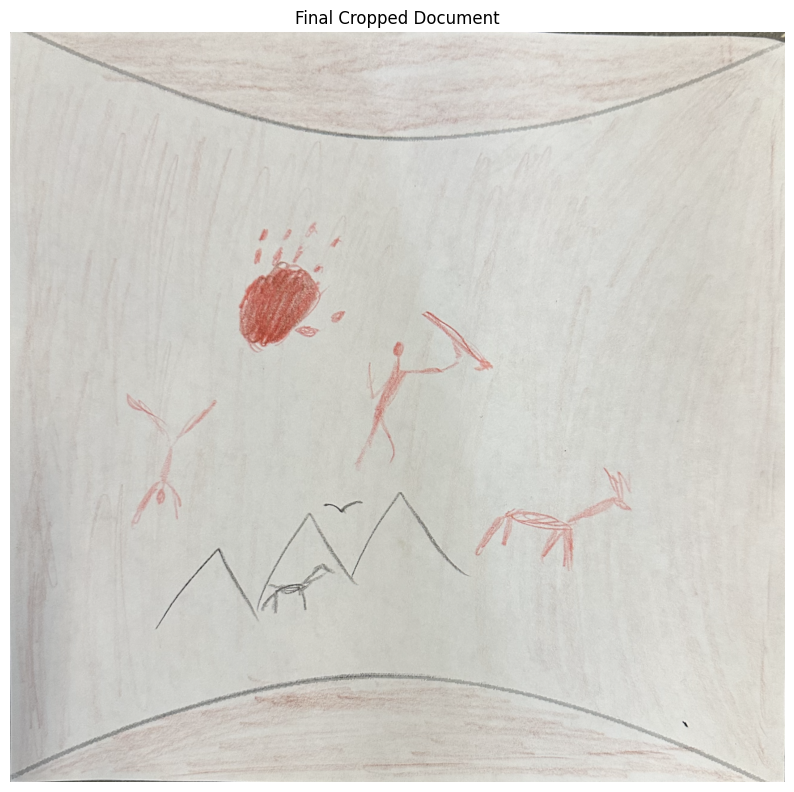

In [ ]:
def apply_perspective_transform(img, points):
    # Warp the perspective to get a top-down view of the document
    points = np.array(points, dtype="float32")
    if points.shape[0] != 4:
        raise ValueError("The input points must be a 4x2 array.")

    # sort points
    rect = np.zeros((4, 2), dtype="float32")
    s = points.sum(axis=1)
    rect[0] = points[np.argmin(s)]
    rect[2] = points[np.argmax(s)]
    diff = np.diff(points, axis=1)
    rect[1] = points[np.argmin(diff)]
    rect[3] = points[np.argmax(diff)]
    (tl, tr, br, bl) = rect

    width = max(np.linalg.norm(br - bl), np.linalg.norm(tr - tl))
    height = max(np.linalg.norm(tr - br), np.linalg.norm(tl - bl))

    dst = np.array([
        [0, 0],
        [width - 1, 0],
        [width - 1, height - 1],
        [0, height - 1]], dtype="float32")

    matrix = cv2.getPerspectiveTransform(rect, dst)
    warped = cv2.warpPerspective(img, matrix, (int(width), int(height)))
    show_image(warped, "Final Cropped Document")
    return warped

cropped_image = apply_perspective_transform(image, contour)

# Download

Make sure to change the `output_drive_path` as needed

In [ ]:
# resize to 2400x2400
resized_cropped_image = cv2.resize(cropped_image, (2400, 2400))

original_filename = os.path.splitext(os.path.basename(input_image_path))[0]
output_filename = f"{original_filename}_cropped.png"

# change path as needed
output_drive_path = f"/content/drive/My Drive/CubeDraw/cropped_images/{output_filename}"
cv2.imwrite(output_drive_path, resized_cropped_image)

print(f"Image saved in Google Drive at: {output_drive_path}")
files.download(output_drive_path)

Image saved in Google Drive at: /content/drive/My Drive/CubeDraw/cropped_images/Down_cropped.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# Limitations and Further improvements
While the current approach effectively isolates the sheet and corrects its perspective, there are still several areas for improvement:

*   **Sheet Detection:** This approach requires the entire sheet to be present in the image as it relies on detecting a complete quadrilateral (corners of the sheet).

*   **Handling Shadows, Wrinkles, and Lighting Variations:** The current implementation does not account for variations in lighting, shadows, or creases on the sheet which could disrupt the viewing experience. I previously explored techniques such as adaptive thresholding and illumination normalization but did not have much luck and did not achieve noticeable results. However a potential alternative could be looking more into deep learning-based denoising which may offer a more comprehensive noise reduction and lighting correction.

*   **More Accurate Cropping:** Due to the linear approximations used in contour detection, some background elements may still be visible in the final cropped image. This becomes more apparent in the 360° view, where even small background remnants can disrupt the VR experience. Refining contour detection with additional preprocessing, such as edge refinement via deep learning segmentation could improve accuracy.

# Alternative Approaches


*   **Image-to-Image Translation (Pix2Pix or Similar Models):** A deep learning approach using image-to-image translation like Pix2Pix could be explored. This would involve training a model on a dataset of noisy input images and their corresponding clean and scanned-like outputs. The model would learn to map noisy images to high-quality results, effectively handling background removal, lighting corrections, and perspective adjustments in a single step. However this method would require a sufficient amout of data to acheive reliable performance.
*   **Deep Learning-Based Segmentation:** Another option is instead of traditional contour detection, a semantic segmentation model (U-Net, DeepLabV3) could be trained to identify the sheet region with higher accuracy. This could allow better handling of occlusions, lighting variations, and non-rectangular distortions.





